In [1]:
%matplotlib inline
import numpy as np 
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from sklearn.model_selection import train_test_split
from subprocess import check_output
from sklearn.metrics import confusion_matrix
import numpy as np
from sklearn.manifold import TSNE

In [2]:
from sklearn.model_selection import GridSearchCV

# Data Preprocessing 

In [4]:
train = pd.read_csv("pml-training.csv", error_bad_lines=False, index_col=False, dtype='unicode')

In [5]:
train.head()

,Unnamed: 0,user_name,raw_timestamp_part_1,raw_timestamp_part_2,cvtd_timestamp,new_window,num_window,roll_belt,pitch_belt,yaw_belt,...,gyros_forearm_x,gyros_forearm_y,gyros_forearm_z,accel_forearm_x,accel_forearm_y,accel_forearm_z,magnet_forearm_x,magnet_forearm_y,magnet_forearm_z,classe
0,1,carlitos,1323084231,788290,05/12/2011 11:23,no,11,1.41,8.07,-94.4,...,0.03,0,-0.02,192,203,-215,-17,654,476,A
1,2,carlitos,1323084231,808298,05/12/2011 11:23,no,11,1.41,8.07,-94.4,...,0.02,0,-0.02,192,203,-216,-18,661,473,A
2,3,carlitos,1323084231,820366,05/12/2011 11:23,no,11,1.42,8.07,-94.4,...,0.03,-0.02,0,196,204,-213,-18,658,469,A
3,4,carlitos,1323084232,120339,05/12/2011 11:23,no,12,1.48,8.05,-94.4,...,0.02,-0.02,0,189,206,-214,-16,658,469,A
4,5,carlitos,1323084232,196328,05/12/2011 11:23,no,12,1.48,8.07,-94.4,...,0.02,0,-0.02,189,206,-214,-17,655,473,A


In [6]:
train.dropna(axis=1,thresh=int(0.20*train.shape[0]),inplace=True)
train.isnull().sum()

Unnamed: 0              0
user_name               0
raw_timestamp_part_1    0
raw_timestamp_part_2    0
cvtd_timestamp          0
new_window              0
num_window              0
roll_belt               0
pitch_belt              0
yaw_belt                0
total_accel_belt        0
gyros_belt_x            0
gyros_belt_y            0
gyros_belt_z            0
accel_belt_x            0
accel_belt_y            0
accel_belt_z            0
magnet_belt_x           0
magnet_belt_y           0
magnet_belt_z           0
roll_arm                0
pitch_arm               0
yaw_arm                 0
total_accel_arm         0
gyros_arm_x             0
gyros_arm_y             0
gyros_arm_z             0
accel_arm_x             0
accel_arm_y             0
accel_arm_z             0
magnet_arm_x            0
magnet_arm_y            0
magnet_arm_z            0
roll_dumbbell           0
pitch_dumbbell          0
yaw_dumbbell            0
total_accel_dumbbell    0
gyros_dumbbell_x        0
gyros_dumbbe

In [7]:
train.columns

Index(['Unnamed: 0', 'user_name', 'raw_timestamp_part_1',
       'raw_timestamp_part_2', 'cvtd_timestamp', 'new_window', 'num_window',
       'roll_belt', 'pitch_belt', 'yaw_belt', 'total_accel_belt',
       'gyros_belt_x', 'gyros_belt_y', 'gyros_belt_z', 'accel_belt_x',
       'accel_belt_y', 'accel_belt_z', 'magnet_belt_x', 'magnet_belt_y',
       'magnet_belt_z', 'roll_arm', 'pitch_arm', 'yaw_arm', 'total_accel_arm',
       'gyros_arm_x', 'gyros_arm_y', 'gyros_arm_z', 'accel_arm_x',
       'accel_arm_y', 'accel_arm_z', 'magnet_arm_x', 'magnet_arm_y',
       'magnet_arm_z', 'roll_dumbbell', 'pitch_dumbbell', 'yaw_dumbbell',
       'total_accel_dumbbell', 'gyros_dumbbell_x', 'gyros_dumbbell_y',
       'gyros_dumbbell_z', 'accel_dumbbell_x', 'accel_dumbbell_y',
       'accel_dumbbell_z', 'magnet_dumbbell_x', 'magnet_dumbbell_y',
       'magnet_dumbbell_z', 'roll_forearm', 'pitch_forearm', 'yaw_forearm',
       'total_accel_forearm', 'gyros_forearm_x', 'gyros_forearm_y',
       'gyros_f

# EDA on DataSet

/Users/vivekyellanti/opt/anaconda3/lib/python3.8/site-packages/seaborn/categorical.py:3704: UserWarning: The `factorplot` function has been renamed to `catplot`. The original name will be removed in a future release. Please update your code. Note that the default `kind` in `factorplot` (`'point'`) has changed `'strip'` in `catplot`.
  warnings.warn(msg)


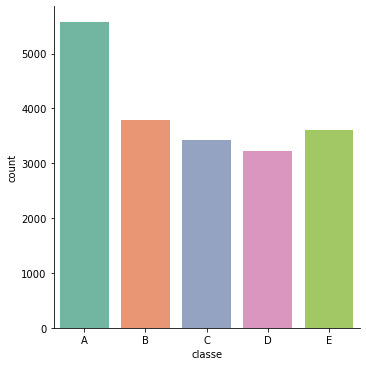

In [8]:
sns.factorplot(x="classe", data=train, kind="count", palette="Set2")

In [9]:
def perform_tsne(X_data, y_data, perplexities, n_iter=1000, img_name_prefix='t-sne'):
        
    for index,perplexity in enumerate(perplexities):
        # perform t-sne
        print('\nperforming tsne with perplexity {} and with {} iterations at max'.format(perplexity, n_iter))
        X_reduced = TSNE(verbose=2, perplexity=perplexity).fit_transform(X_data)
        print('Done..')
        
        # prepare the data for seaborn         
        print('Creating plot for this t-sne visualization..')
        df = pd.DataFrame({'x':X_reduced[:,0], 'y':X_reduced[:,1] ,'label':y_data})
        
        # draw the plot in appropriate place in the grid
        sns.lmplot(data=df, x='x', y='y', hue='label', fit_reg=False, size=8,\
                   palette="Set1",markers=[1,2,3,4,5])
        plt.title("perplexity : {} and max_iter : {}".format(perplexity, n_iter))
        img_name = img_name_prefix + '_perp_{}_iter_{}.png'.format(perplexity, n_iter)
        print('saving this plot as image in present working directory...')
        plt.savefig(img_name)
        plt.show()
        print('Done')


In [14]:
train['new_window'] = train['new_window'].map( {'no': 0, 'yes': 1} ).astype(int)

train = train.drop(['Unnamed: 0','cvtd_timestamp'], axis=1)

train['user_name'] =  train['user_name'].map( {'carlitos': 0, 'pedro': 1, 'adelmo': 2, 'charles': 3,
     'eurico': 4, 'jeremy': 5} ).astype(int)



performing tsne with perplexity 2 and with 1000 iterations at max
[t-SNE] Computing 7 nearest neighbors...
[t-SNE] Indexed 19622 samples in 0.046s...
[t-SNE] Computed neighbors for 19622 samples in 0.412s...
[t-SNE] Computed conditional probabilities for sample 1000 / 19622
[t-SNE] Computed conditional probabilities for sample 2000 / 19622
[t-SNE] Computed conditional probabilities for sample 3000 / 19622
[t-SNE] Computed conditional probabilities for sample 4000 / 19622
[t-SNE] Computed conditional probabilities for sample 5000 / 19622
[t-SNE] Computed conditional probabilities for sample 6000 / 19622
[t-SNE] Computed conditional probabilities for sample 7000 / 19622
[t-SNE] Computed conditional probabilities for sample 8000 / 19622
[t-SNE] Computed conditional probabilities for sample 9000 / 19622
[t-SNE] Computed conditional probabilities for sample 10000 / 19622
[t-SNE] Computed conditional probabilities for sample 11000 / 19622
[t-SNE] Computed conditional probabilities for sampl

/Users/vivekyellanti/opt/anaconda3/lib/python3.8/site-packages/seaborn/regression.py:580: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


saving this plot as image in present working directory...


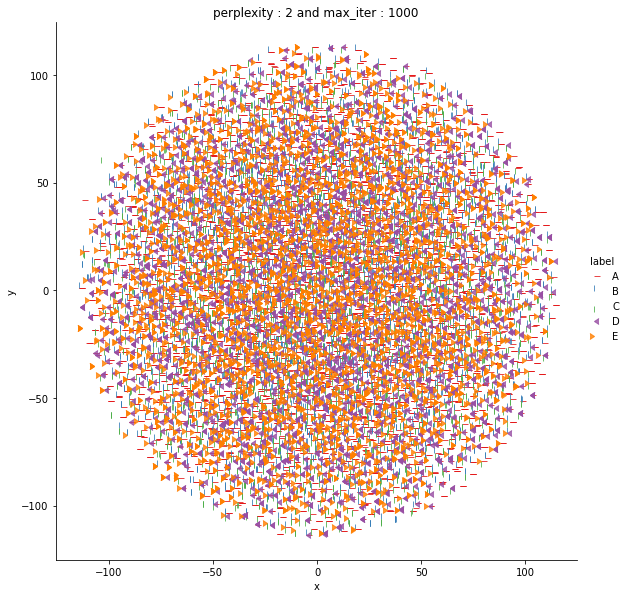

Done

performing tsne with perplexity 10 and with 1000 iterations at max
[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 19622 samples in 0.048s...
[t-SNE] Computed neighbors for 19622 samples in 0.604s...
[t-SNE] Computed conditional probabilities for sample 1000 / 19622
[t-SNE] Computed conditional probabilities for sample 2000 / 19622
[t-SNE] Computed conditional probabilities for sample 3000 / 19622
[t-SNE] Computed conditional probabilities for sample 4000 / 19622
[t-SNE] Computed conditional probabilities for sample 5000 / 19622
[t-SNE] Computed conditional probabilities for sample 6000 / 19622
[t-SNE] Computed conditional probabilities for sample 7000 / 19622
[t-SNE] Computed conditional probabilities for sample 8000 / 19622
[t-SNE] Computed conditional probabilities for sample 9000 / 19622
[t-SNE] Computed conditional probabilities for sample 10000 / 19622
[t-SNE] Computed conditional probabilities for sample 11000 / 19622
[t-SNE] Computed conditional probabilities fo

/Users/vivekyellanti/opt/anaconda3/lib/python3.8/site-packages/seaborn/regression.py:580: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


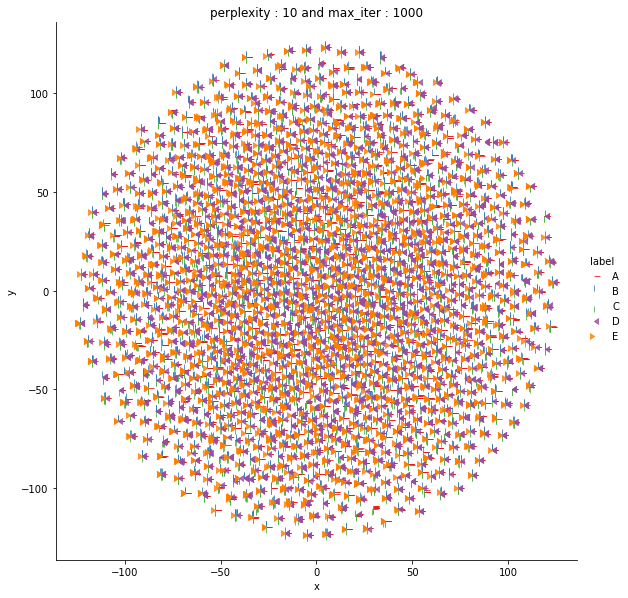

Done

performing tsne with perplexity 20 and with 1000 iterations at max
[t-SNE] Computing 61 nearest neighbors...
[t-SNE] Indexed 19622 samples in 0.051s...
[t-SNE] Computed neighbors for 19622 samples in 0.815s...
[t-SNE] Computed conditional probabilities for sample 1000 / 19622
[t-SNE] Computed conditional probabilities for sample 2000 / 19622
[t-SNE] Computed conditional probabilities for sample 3000 / 19622
[t-SNE] Computed conditional probabilities for sample 4000 / 19622
[t-SNE] Computed conditional probabilities for sample 5000 / 19622
[t-SNE] Computed conditional probabilities for sample 6000 / 19622
[t-SNE] Computed conditional probabilities for sample 7000 / 19622
[t-SNE] Computed conditional probabilities for sample 8000 / 19622
[t-SNE] Computed conditional probabilities for sample 9000 / 19622
[t-SNE] Computed conditional probabilities for sample 10000 / 19622
[t-SNE] Computed conditional probabilities for sample 11000 / 19622
[t-SNE] Computed conditional probabilities fo

/Users/vivekyellanti/opt/anaconda3/lib/python3.8/site-packages/seaborn/regression.py:580: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


saving this plot as image in present working directory...


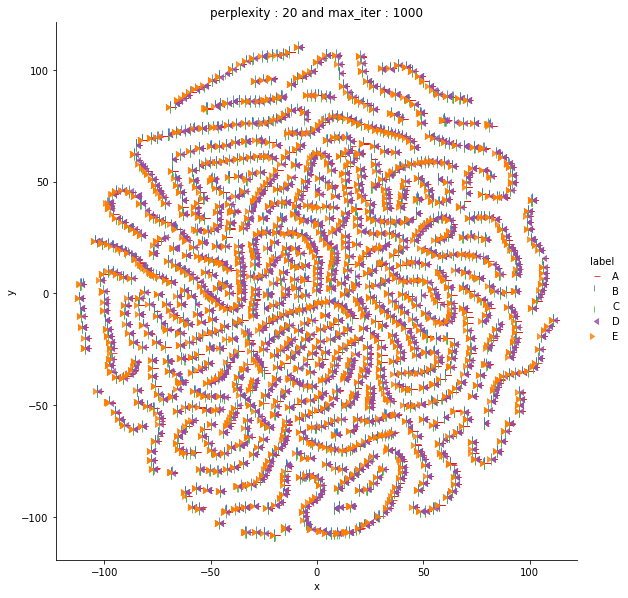

Done

performing tsne with perplexity 50 and with 1000 iterations at max
[t-SNE] Computing 151 nearest neighbors...
[t-SNE] Indexed 19622 samples in 0.059s...
[t-SNE] Computed neighbors for 19622 samples in 1.332s...
[t-SNE] Computed conditional probabilities for sample 1000 / 19622
[t-SNE] Computed conditional probabilities for sample 2000 / 19622
[t-SNE] Computed conditional probabilities for sample 3000 / 19622
[t-SNE] Computed conditional probabilities for sample 4000 / 19622
[t-SNE] Computed conditional probabilities for sample 5000 / 19622
[t-SNE] Computed conditional probabilities for sample 6000 / 19622
[t-SNE] Computed conditional probabilities for sample 7000 / 19622
[t-SNE] Computed conditional probabilities for sample 8000 / 19622
[t-SNE] Computed conditional probabilities for sample 9000 / 19622
[t-SNE] Computed conditional probabilities for sample 10000 / 19622
[t-SNE] Computed conditional probabilities for sample 11000 / 19622
[t-SNE] Computed conditional probabilities f

/Users/vivekyellanti/opt/anaconda3/lib/python3.8/site-packages/seaborn/regression.py:580: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


saving this plot as image in present working directory...


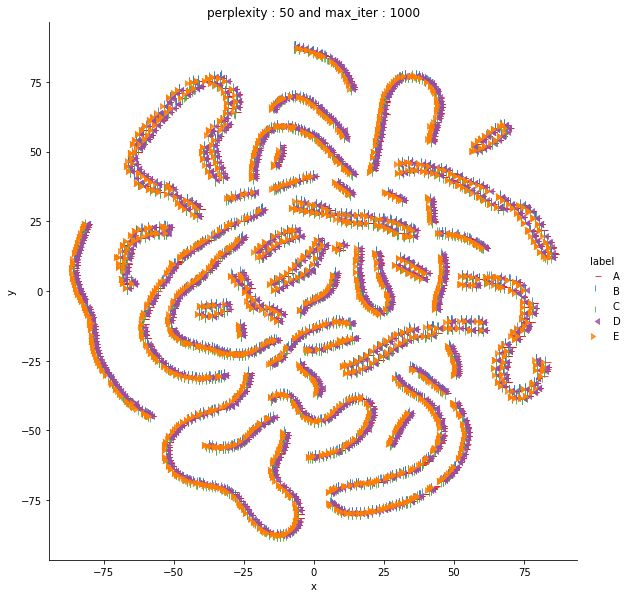

Done


In [15]:
X_pre_tsne = train.drop(['classe'], axis=1)
y_pre_tsne = train['classe']
perform_tsne(X_data = X_pre_tsne,y_data=y_pre_tsne, perplexities =[2,10,20,50])

In [10]:
train_df = pd.read_csv('pml-training.csv', error_bad_lines=False, index_col=False).drop('Unnamed: 0', axis=1)
test_df = pd.read_csv('pml-testing.csv', error_bad_lines=False, index_col=False).drop('Unnamed: 0', axis=1)

/Users/vivekyellanti/opt/anaconda3/lib/python3.8/site-packages/IPython/core/interactiveshell.py:3146: DtypeWarning: Columns (11,14,19,22,25,70,73,86,87,89,90,94,97,100) have mixed types.Specify dtype option on import or set low_memory=False.
  has_raised = await self.run_ast_nodes(code_ast.body, cell_name,


In [11]:
train_df = train_df.sample(frac=1).reset_index(drop=True)

In [12]:
train_df.describe()

,raw_timestamp_part_1,raw_timestamp_part_2,num_window,roll_belt,pitch_belt,yaw_belt,total_accel_belt,max_roll_belt,max_picth_belt,min_roll_belt,...,var_yaw_forearm,gyros_forearm_x,gyros_forearm_y,gyros_forearm_z,accel_forearm_x,accel_forearm_y,accel_forearm_z,magnet_forearm_x,magnet_forearm_y,magnet_forearm_z
count,1.962200e+04,19622.000000,19622.000000,19622.000000,19622.000000,19622.000000,19622.000000,406.000000,406.000000,406.000000,...,406.000000,19622.000000,19622.000000,19622.000000,19622.000000,19622.000000,19622.000000,19622.000000,19622.000000,19622.000000
mean,1.322827e+09,500656.144277,430.640047,64.407197,0.305283,-11.205061,11.312608,-6.667241,12.923645,-10.436453,...,4639.849068,0.157951,0.075175,0.151245,-61.651819,163.655896,-55.291917,-312.575884,380.116445,393.613745
std,2.049277e+05,288222.879958,247.909554,62.750255,22.351242,95.193926,7.742309,94.594252,8.005960,93.616774,...,7284.972361,0.648618,3.100725,1.754483,180.593687,200.130082,138.396947,346.958482,509.373742,369.268747
min,1.322490e+09,294.000000,1.000000,-28.900000,-55.800000,-180.000000,0.000000,-94.300000,3.000000,-180.000000,...,0.000000,-22.000000,-7.020000,-8.090000,-498.000000,-632.000000,-446.000000,-1280.000000,-896.000000,-973.000000
25%,1.322673e+09,252912.250000,222.000000,1.100000,1.760000,-88.300000,3.000000,-88.000000,5.000000,-88.400000,...,0.274550,-0.220000,-1.460000,-0.180000,-178.000000,57.000000,-182.000000,-616.000000,2.000000,191.000000
50%,1.322833e+09,496380.000000,424.000000,113.000000,5.280000,-13.000000,17.000000,-5.100000,18.000000,-7.850000,...,612.214225,0.050000,0.030000,0.080000,-57.000000,201.000000,-39.000000,-378.000000,591.000000,511.000000
75%,1.323084e+09,751890.750000,644.000000,123.000000,14.900000,12.900000,18.000000,18.500000,19.000000,9.050000,...,7368.414252,0.560000,1.620000,0.490000,76.000000,312.000000,26.000000,-73.000000,737.000000,653.000000
max,1.323095e+09,998801.000000,864.000000,162.000000,60.300000,179.000000,29.000000,180.000000,30.000000,173.000000,...,39009.333330,3.970000,311.000000,231.000000,477.000000,923.000000,291.000000,672.000000,1480.000000,1090.000000


In [13]:
train_df['classe']=train_df['classe'].astype('category')

Few Pair plots to show  corelations between two variables

/Users/vivekyellanti/opt/anaconda3/lib/python3.8/site-packages/seaborn/axisgrid.py:1912: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


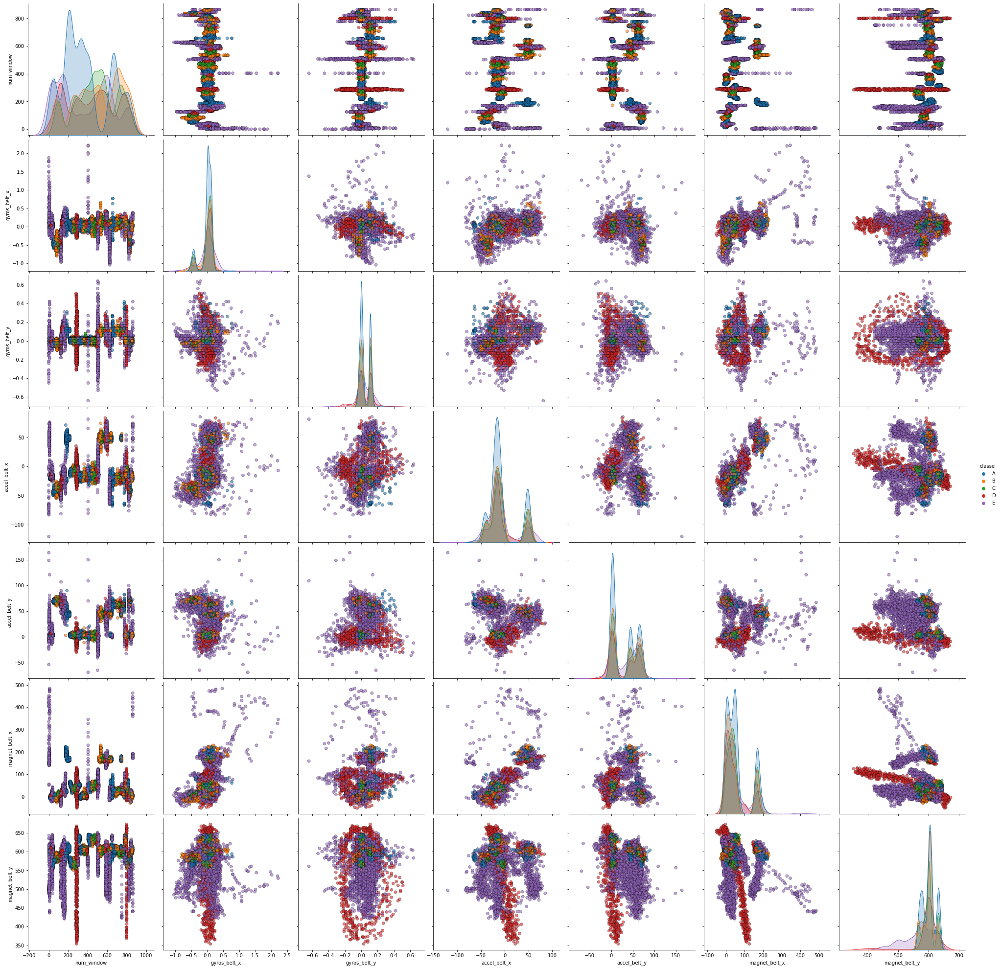

In [16]:
pp1=train_df.filter(items=['num_window', 'gyros_belt_x', 'gyros_belt_y', 'accel_belt_x', 'accel_belt_y',  'magnet_belt_x','magnet_belt_y', 'classe'])
sns.pairplot(pp1, hue='classe',  plot_kws = {'alpha': 0.6,  'edgecolor': 'k'},size = 4)

/Users/vivekyellanti/opt/anaconda3/lib/python3.8/site-packages/seaborn/axisgrid.py:1912: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


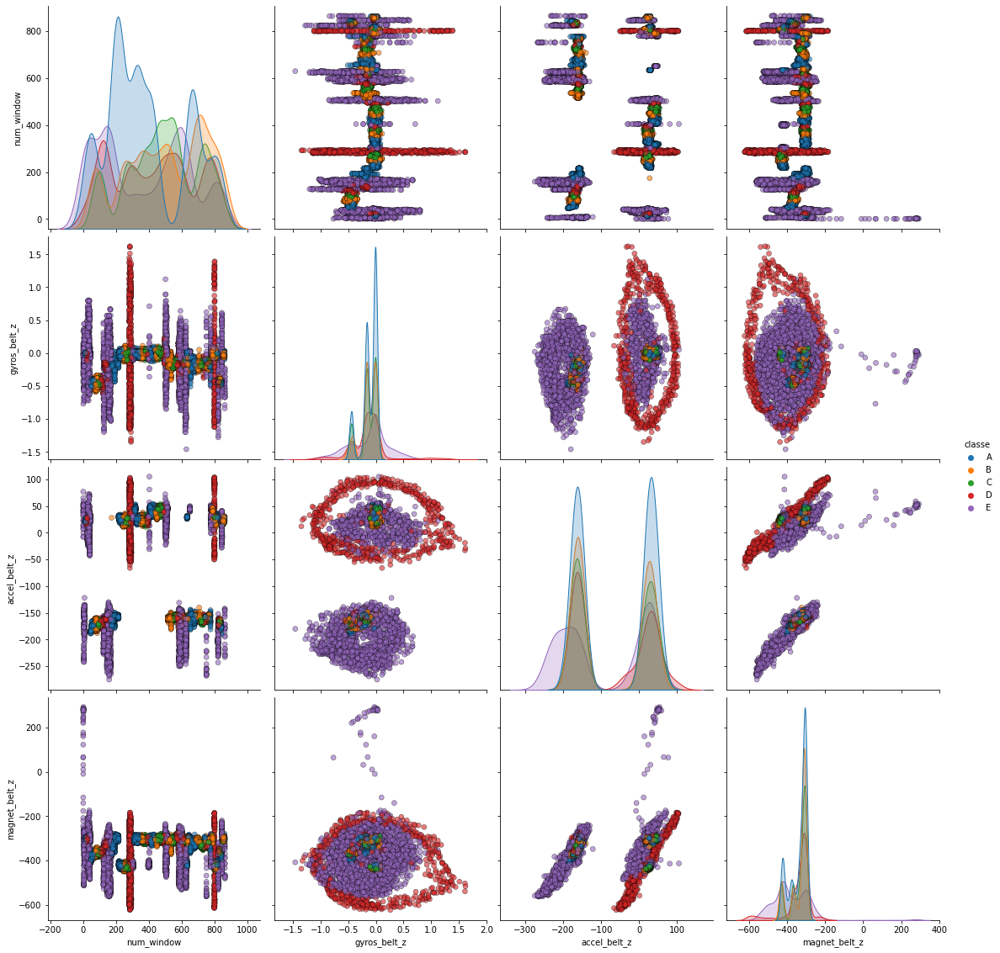

In [17]:
pp2=train_df.filter(items=['num_window', 'gyros_belt_z', 'accel_belt_z', 'magnet_belt_z', 'classe'])
sns.pairplot(pp2, hue='classe',  plot_kws = {'alpha': 0.6, 'edgecolor': 'k'},size = 4)

/Users/vivekyellanti/opt/anaconda3/lib/python3.8/site-packages/seaborn/axisgrid.py:1912: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


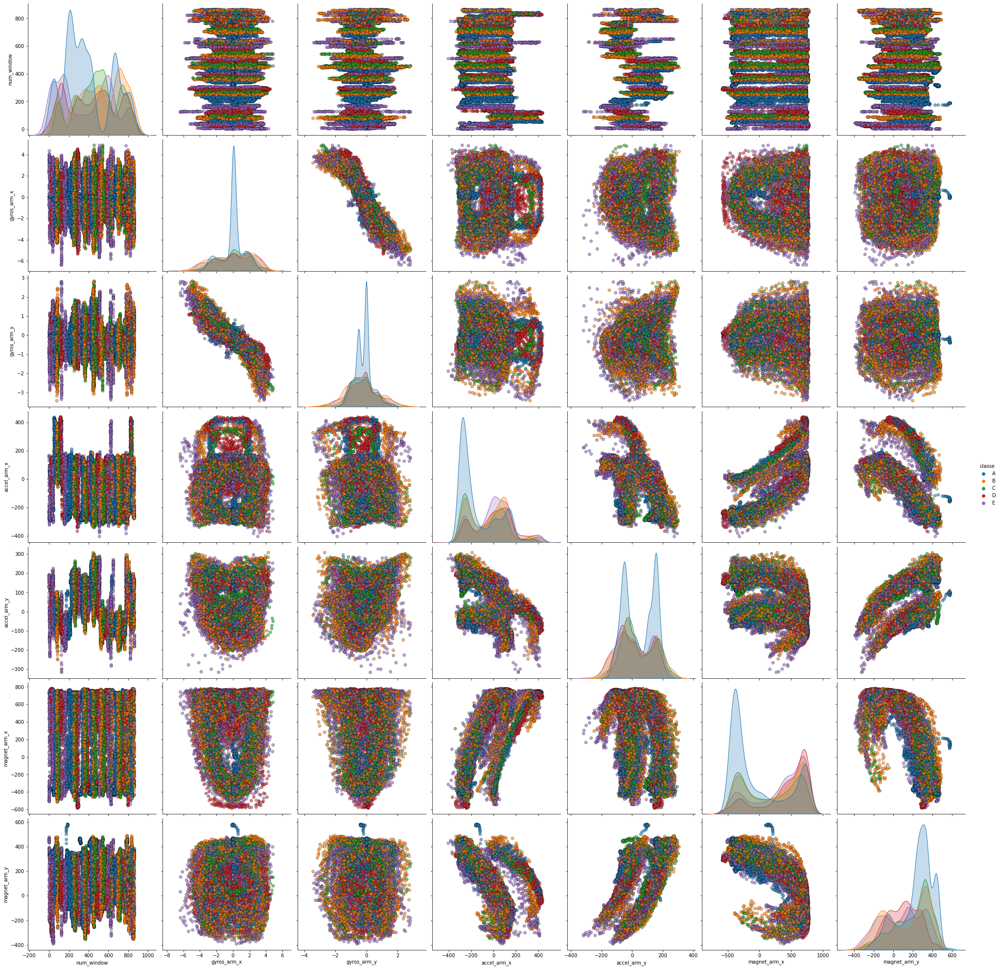

In [19]:
pp3=train_df.filter(items=['num_window', 'gyros_arm_x', 'gyros_arm_y', 'accel_arm_x', 'accel_arm_y',  'magnet_arm_x','magnet_arm_y', 'classe'])
sns.pairplot(pp3, hue='classe',  plot_kws = {'alpha': 0.6,  'edgecolor': 'k'},size = 4)

# Classification 

In [20]:
X=train.drop(['classe'], axis=1)
Y=train['classe']

In [21]:
X_train, X_test,Y_train,Y_test = train_test_split(X, Y, test_size = 0.30, random_state=1)

In [22]:
X_train.shape

(13735, 57)

In [23]:
Y_train.shape

(13735,)

# SVC 

In [24]:
from sklearn.metrics import classification_report
from sklearn.metrics import accuracy_score

In [25]:
from sklearn.svm import SVC
svc=SVC()
svc.fit(X_train, Y_train)
Y_pred_svc=svc.predict(X_test)
print("SVC report \n", classification_report(Y_pred_svc,Y_test))
print("Accuracy Score",accuracy_score(Y_pred_svc,Y_test))

SVC report 
               precision    recall  f1-score   support

           A       1.00      0.29      0.45      5887
           B       0.00      0.00      0.00         0
           C       0.00      0.00      0.00         0
           D       0.00      0.00      0.00         0
           E       0.00      0.00      0.00         0

    accuracy                           0.29      5887
   macro avg       0.20      0.06      0.09      5887
weighted avg       1.00      0.29      0.45      5887

Accuracy Score 0.29064039408866993


/Users/vivekyellanti/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


# KNN

In [26]:
from sklearn.neighbors import KNeighborsClassifier
KNN=KNeighborsClassifier()
KNN.fit(X_train, Y_train)
Y_pred_KNN=KNN.predict(X_test)
print("K-nearest neighbors Classifier report \n", classification_report(Y_pred_KNN,Y_test))
print("Accuracy Score",accuracy_score(Y_pred_KNN,Y_test))

K-nearest neighbors Classifier report 
               precision    recall  f1-score   support

           A       0.56      0.38      0.45      2536
           B       0.21      0.25      0.23       964
           C       0.22      0.23      0.22       983
           D       0.19      0.22      0.20       802
           E       0.16      0.29      0.21       602

    accuracy                           0.30      5887
   macro avg       0.27      0.27      0.26      5887
weighted avg       0.36      0.30      0.32      5887

Accuracy Score 0.30202140309155767


In [29]:
parameters_KNN = {
    'n_neighbors': (1,10, 1),
    'leaf_size': (20,40,1),
    'p': (1,2),
    'weights': ('uniform', 'distance'),
    'metric': ('minkowski', 'chebyshev')}
                   

clf_knn = GridSearchCV(KNeighborsClassifier(), parameters_KNN,cv=5,n_jobs=-1)
clf_knn.fit(X_train,Y_train)
Y_pred_eknn=clf_knn.predict(X_test)

In [30]:
print("K-nearest neighbors Classifier report \n", classification_report(Y_pred_eknn,Y_test))
print("Accuracy Score",accuracy_score(Y_pred_eknn,Y_test))

K-nearest neighbors Classifier report 
               precision    recall  f1-score   support

           A       0.63      0.61      0.62      1773
           B       0.40      0.45      0.42      1006
           C       0.46      0.39      0.42      1194
           D       0.43      0.38      0.40      1083
           E       0.42      0.53      0.46       831

    accuracy                           0.48      5887
   macro avg       0.47      0.47      0.47      5887
weighted avg       0.49      0.48      0.48      5887

Accuracy Score 0.48360794971972143


In [31]:
print(clf_knn.best_params_)

{'leaf_size': 20, 'metric': 'minkowski', 'n_neighbors': 1, 'p': 1, 'weights': 'uniform'}


# Gaussian Navie Bayes

In [32]:
from sklearn.naive_bayes import GaussianNB
GaussNB=GaussianNB()
GaussNB.fit(X_train, Y_train)
Y_pred_GNB=GaussNB.predict(X_test)
print("Gaussian Naive Bayes report \n", classification_report(Y_pred_GNB,Y_test))
print("Accuracy Score",accuracy_score(Y_pred_GNB,Y_test))

Gaussian Naive Bayes report 
               precision    recall  f1-score   support

           A       0.59      0.71      0.64      1406
           B       0.49      0.50      0.50      1118
           C       0.54      0.38      0.44      1469
           D       0.45      0.41      0.43      1028
           E       0.47      0.58      0.52       866

    accuracy                           0.52      5887
   macro avg       0.51      0.52      0.51      5887
weighted avg       0.52      0.52      0.51      5887

Accuracy Score 0.5170715135043316


In [33]:
GaussNB_classifier = GaussianNB()

params_NB = {'var_smoothing': np.logspace(0,-9, num=100)}
Gauss_NB = GridSearchCV(estimator=GaussNB_classifier, 
                 param_grid=params_NB, 
                 cv=3,
                 verbose=1, 
                 scoring='accuracy') 
Gauss_NB.fit(X_train, Y_train)

Gauss_NB.best_params_

Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 300 out of 300 | elapsed:   28.6s finished


{'var_smoothing': 4.328761281083061e-09}

In [34]:
Y_pred_GaussNB=Gauss_NB.predict(X_test)

In [35]:
print("Gaussian Naive Bayes report \n", classification_report(Y_pred_GaussNB,Y_test))
print("Accuracy Score",accuracy_score(Y_pred_GaussNB,Y_test))

Gaussian Naive Bayes report 
               precision    recall  f1-score   support

           A       0.61      0.68      0.64      1545
           B       0.48      0.53      0.50      1042
           C       0.52      0.38      0.44      1412
           D       0.45      0.40      0.43      1052
           E       0.46      0.58      0.51       836

    accuracy                           0.52      5887
   macro avg       0.50      0.51      0.50      5887
weighted avg       0.52      0.52      0.51      5887

Accuracy Score 0.5163920502802786


In [36]:
print(Gauss_NB.best_params_)

{'var_smoothing': 4.328761281083061e-09}


# Ada Boost

In [37]:
from sklearn.ensemble import AdaBoostClassifier
AdaBoost=AdaBoostClassifier()
AdaBoost.fit(X_train, Y_train)
Y_pred_AdaBoost=AdaBoost.predict(X_test)
print("AdaBoost Classifier report \n", classification_report(Y_pred_AdaBoost,Y_test))
print("Accuracy Score",accuracy_score(Y_pred_AdaBoost,Y_test))

AdaBoost Classifier report 
               precision    recall  f1-score   support

           A       0.73      0.96      0.83      1297
           B       0.53      0.58      0.55      1046
           C       0.76      0.50      0.60      1545
           D       0.52      0.49      0.51      1021
           E       0.77      0.82      0.79       978

    accuracy                           0.67      5887
   macro avg       0.66      0.67      0.66      5887
weighted avg       0.67      0.67      0.66      5887

Accuracy Score 0.6675726176320707


# Extremely Randomized Trees Classifier report

In [38]:
from sklearn.tree import ExtraTreeClassifier
Randtree=ExtraTreeClassifier()
Randtree.fit(X_train, Y_train)
Y_pred_Randtree=Randtree.predict(X_test)
print("Extremely Randomized Trees Classifier report \n", classification_report(Y_pred_Randtree,Y_test))
print("Accuracy Score",accuracy_score(Y_pred_Randtree,Y_test))

Extremely Randomized Trees Classifier report 
               precision    recall  f1-score   support

           A       0.94      0.95      0.95      1683
           B       0.87      0.88      0.88      1142
           C       0.88      0.86      0.87      1047
           D       0.87      0.85      0.86       976
           E       0.91      0.92      0.92      1039

    accuracy                           0.90      5887
   macro avg       0.90      0.89      0.90      5887
weighted avg       0.90      0.90      0.90      5887

Accuracy Score 0.9011381009002888


# BaggingClassifier

In [40]:
from sklearn.ensemble import BaggingClassifier
BaggingC=BaggingClassifier()
BaggingC.fit(X_train, Y_train)
Y_pred_BaggingC=BaggingC.predict(X_test)
print("Bagging Classifier report \n", classification_report(Y_pred_BaggingC,Y_test))
print("Accuracy Score",accuracy_score(Y_pred_BaggingC,Y_test))

Bagging Classifier report 
               precision    recall  f1-score   support

           A       1.00      1.00      1.00      1716
           B       0.99      1.00      0.99      1144
           C       1.00      0.98      0.99      1036
           D       0.99      1.00      0.99       942
           E       1.00      1.00      1.00      1049

    accuracy                           0.99      5887
   macro avg       0.99      0.99      0.99      5887
weighted avg       0.99      0.99      0.99      5887

Accuracy Score 0.9947341600135893


In [41]:
BaggingClassifier_parameters = {"n_estimators":list(range(50,60))}
clf_BaggingC = GridSearchCV(BaggingClassifier(), BaggingClassifier_parameters ,cv=3, verbose=1)
clf_BaggingC.fit(X_train, Y_train)

Fitting 3 folds for each of 10 candidates, totalling 30 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  30 out of  30 | elapsed:  6.2min finished


GridSearchCV(cv=3, estimator=BaggingClassifier(),
             param_grid={'n_estimators': [50, 51, 52, 53, 54, 55, 56, 57, 58,
                                          59]},
             verbose=1)

In [42]:
Y_pred_BaggC=clf_BaggingC.predict(X_test)
print("Bagging Classifier report \n", classification_report(Y_pred_BaggC,Y_test))
print("Accuracy Score",accuracy_score(Y_pred_BaggC,Y_test))

Bagging Classifier report 
               precision    recall  f1-score   support

           A       1.00      1.00      1.00      1711
           B       1.00      1.00      1.00      1148
           C       1.00      0.99      0.99      1031
           D       0.99      0.99      0.99       950
           E       0.99      1.00      1.00      1047

    accuracy                           1.00      5887
   macro avg       1.00      1.00      1.00      5887
weighted avg       1.00      1.00      1.00      5887

Accuracy Score 0.9962629522677086


In [43]:
print(clf_BaggingC.best_params_)

{'n_estimators': 59}


# Gradient Boosting

In [44]:
from sklearn.ensemble import GradientBoostingClassifier
GradBC=GradientBoostingClassifier()
GradBC.fit(X_train, Y_train)
Y_pred_GradBC=GradBC.predict(X_test)
print("Gradient Boosting Classifier report \n", classification_report(Y_pred_GradBC,Y_test))
print("Accuracy Score",accuracy_score(Y_pred_GradBC,Y_test))

Gradient Boosting Classifier report 
               precision    recall  f1-score   support

           A       1.00      1.00      1.00      1716
           B       0.99      0.99      0.99      1148
           C       0.99      0.98      0.99      1033
           D       0.98      0.98      0.98       958
           E       0.98      1.00      0.99      1032

    accuracy                           0.99      5887
   macro avg       0.99      0.99      0.99      5887
weighted avg       0.99      0.99      0.99      5887

Accuracy Score 0.9906573806692712


# Decision Tree Classifier report

In [45]:
from sklearn.tree import DecisionTreeClassifier
DTreeC=DecisionTreeClassifier()
DTreeC.fit(X_train, Y_train)
Y_pred_DTreeC=DTreeC.predict(X_test)
print("Decision Tree Classifier report \n", classification_report(Y_pred_DTreeC,Y_test))
print("Accuracy Score",accuracy_score(Y_pred_DTreeC,Y_test))

Decision Tree Classifier report 
               precision    recall  f1-score   support

           A       1.00      1.00      1.00      1711
           B       0.98      0.99      0.98      1137
           C       0.98      0.97      0.98      1033
           D       0.98      0.97      0.97       961
           E       0.98      0.99      0.99      1045

    accuracy                           0.98      5887
   macro avg       0.98      0.98      0.98      5887
weighted avg       0.98      0.98      0.98      5887

Accuracy Score 0.983692882622728


# Random Forest Classifier

In [46]:
from sklearn.ensemble import RandomForestClassifier
RandFC=RandomForestClassifier()
RandFC.fit(X_train, Y_train)
Y_pred_RandFC=RandFC.predict(X_test)
print("Random Forest Classifier report \n", classification_report(Y_pred_RandFC,Y_test))
print("Accuracy Score",accuracy_score(Y_pred_RandFC,Y_test))

Random Forest Classifier report 
               precision    recall  f1-score   support

           A       1.00      1.00      1.00      1712
           B       1.00      1.00      1.00      1152
           C       1.00      0.99      0.99      1028
           D       0.99      0.99      0.99       948
           E       0.99      1.00      1.00      1047

    accuracy                           1.00      5887
   macro avg       1.00      1.00      1.00      5887
weighted avg       1.00      1.00      1.00      5887

Accuracy Score 0.9959232206556821


In [47]:
RandomForestClassifier_parameters = {"n_estimators":list(range(10,20)),"criterion": ["gini", "entropy"]}
clf_RandFC = GridSearchCV(RandomForestClassifier(), RandomForestClassifier_parameters, cv=3, verbose=1)
clf_RandFC.fit(X_train, Y_train)

Fitting 3 folds for each of 20 candidates, totalling 60 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  60 out of  60 | elapsed:   30.8s finished


GridSearchCV(cv=3, estimator=RandomForestClassifier(),
             param_grid={'criterion': ['gini', 'entropy'],
                         'n_estimators': [10, 11, 12, 13, 14, 15, 16, 17, 18,
                                          19]},
             verbose=1)

In [48]:
Y_pred_RandomFC=clf_RandFC.predict(X_test)
print("Random Forest Classifier report \n", classification_report(Y_pred_RandomFC,Y_test))
print("Accuracy Score",accuracy_score(Y_pred_RandomFC,Y_test))

Random Forest Classifier report 
               precision    recall  f1-score   support

           A       1.00      1.00      1.00      1712
           B       1.00      1.00      1.00      1150
           C       1.00      0.99      0.99      1027
           D       0.99      0.99      0.99       950
           E       0.99      1.00      1.00      1048

    accuracy                           1.00      5887
   macro avg       1.00      1.00      1.00      5887
weighted avg       1.00      1.00      1.00      5887

Accuracy Score 0.9962629522677086


In [49]:
print(clf_RandFC.best_params_)

{'criterion': 'entropy', 'n_estimators': 19}


# Changing the way the tree learns

Random Forest and Bagging Classifier

In [50]:
BaggC_RandF=BaggingClassifier(RandomForestClassifier())
BaggC_RandF.fit(X_train, Y_train)
Y_pred_BaggC_RandF=BaggC_RandF.predict(X_test)
print("Random Forest and Bagging Classifier report \n", classification_report(Y_pred_BaggC_RandF,Y_test))

Random Forest and Bagging Classifier report 
               precision    recall  f1-score   support

           A       1.00      1.00      1.00      1712
           B       1.00      0.99      1.00      1153
           C       0.99      0.99      0.99      1027
           D       0.99      0.99      0.99       951
           E       0.99      1.00      0.99      1044

    accuracy                           1.00      5887
   macro avg       0.99      0.99      0.99      5887
weighted avg       1.00      1.00      1.00      5887



In [51]:
print("Accuracy Score",accuracy_score(Y_pred_BaggC_RandF,Y_test))

Accuracy Score 0.995243757431629


Decision Tree and Bagging Classifier

In [52]:
BaggC_DTree = BaggingClassifier(DecisionTreeClassifier())
BaggC_DTree.fit(X_train, Y_train)
Y_pred_BaggC_DTree=BaggC_DTree.predict(X_test)


In [53]:
print("Decision and Bagging Classifier report \n", classification_report(Y_pred_BaggC_DTree,Y_test))
print("Accuracy Score",accuracy_score(Y_pred_BaggC_DTree,Y_test))

Decision and Bagging Classifier report 
               precision    recall  f1-score   support

           A       1.00      1.00      1.00      1716
           B       0.99      0.99      0.99      1143
           C       1.00      0.98      0.99      1038
           D       0.98      0.99      0.99       947
           E       0.99      1.00      1.00      1043

    accuracy                           0.99      5887
   macro avg       0.99      0.99      0.99      5887
weighted avg       0.99      0.99      0.99      5887

Accuracy Score 0.9930355019534568


# Confusion Matrixes 

Text(0.5, 51.00000000000006, 'Predicted label')

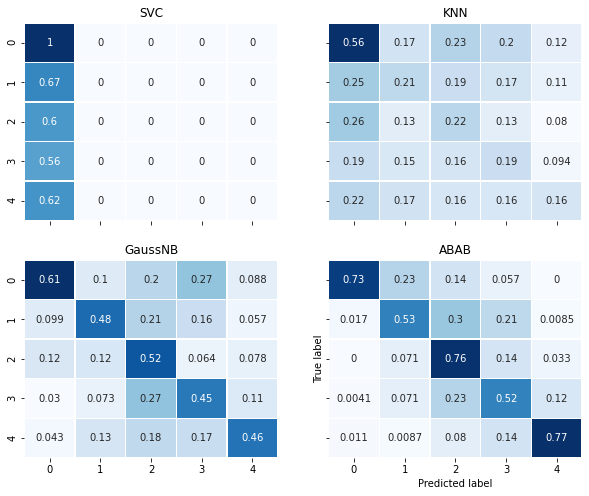

In [54]:
from sklearn.metrics import confusion_matrix

con_matrix_SVC = confusion_matrix(Y_test,Y_pred_svc)
con_matrix_SVC =con_matrix_SVC / con_matrix_SVC.astype(np.float).sum(axis=1)

con_matrix_KNN = confusion_matrix(Y_test,Y_pred_KNN)
con_matrix_KNN =con_matrix_KNN / con_matrix_KNN.astype(np.float).sum(axis=1)

con_matrix_GaussNB = confusion_matrix(Y_test, Y_pred_GaussNB)
con_matrix_GaussNB =con_matrix_GaussNB / con_matrix_GaussNB.astype(np.float).sum(axis=1)

con_matrix_AdaBoost = confusion_matrix(Y_test, Y_pred_AdaBoost)
con_matrix_AdaBoost =con_matrix_AdaBoost / con_matrix_AdaBoost.astype(np.float).sum(axis=1)

f, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, sharex='col', sharey='row', figsize=(10,8))
sns.heatmap(con_matrix_SVC, annot = True,  linewidths=.5, ax=ax1, cbar =None, cmap=plt.cm.Blues)
ax1.set_title('SVC')
plt.ylabel('True label')
plt.xlabel('Predicted label')
sns.heatmap(con_matrix_KNN, annot = True,  linewidths=.5, ax=ax2, cbar =None, cmap=plt.cm.Blues,)
ax2.set_title('KNN')
plt.ylabel('True label')
plt.xlabel('Predicted label')
sns.heatmap(con_matrix_GaussNB, annot = True, linewidths=.5, ax=ax3, cbar =None, cmap=plt.cm.Blues)
ax3.set_title('GaussNB')
plt.ylabel('True label')
plt.xlabel('Predicted label')
sns.heatmap(con_matrix_AdaBoost, annot = True, linewidths=.5, ax=ax4, cbar =None, cmap=plt.cm.Blues)
ax4.set_title('ABAB')
plt.ylabel('True label')
plt.xlabel('Predicted label')

Text(0.5, 51.00000000000006, 'Predicted label')

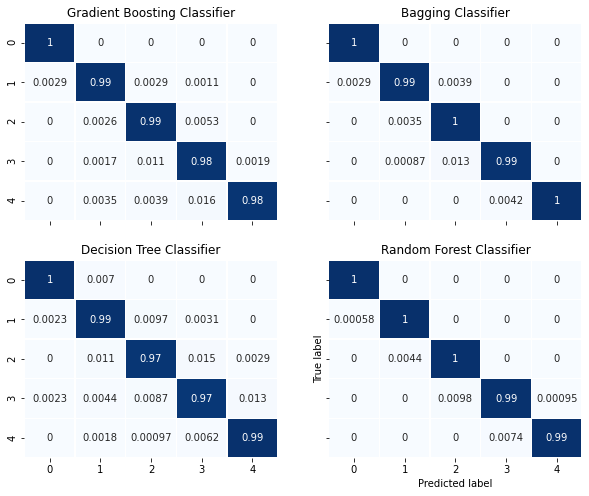

In [56]:
from sklearn.metrics import confusion_matrix

con_matrix_GradBC = confusion_matrix(Y_test, Y_pred_GradBC)
con_matrix_GradBC =con_matrix_GradBC / con_matrix_GradBC.astype(np.float).sum(axis=1)

con_matrix_BaggingC = confusion_matrix(Y_test, Y_pred_BaggingC)
con_matrix_BaggingC =con_matrix_BaggingC / con_matrix_BaggingC.astype(np.float).sum(axis=1)

con_matrix_DtreeC = confusion_matrix(Y_pred_DTreeC,Y_test)
con_matrix_DtreeC =con_matrix_DtreeC / con_matrix_DtreeC.astype(np.float).sum(axis=1)

con_matrix_RandFC = confusion_matrix(Y_test, Y_pred_RandFC)
con_matrix_RandFC =con_matrix_RandFC / con_matrix_RandFC.astype(np.float).sum(axis=1)

f, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, sharex='col', sharey='row', figsize=(10,8))
sns.heatmap(con_matrix_GradBC, annot = True,  linewidths=.5, ax=ax1, cbar =None, cmap=plt.cm.Blues)
ax1.set_title('Gradient Boosting Classifier')
plt.ylabel('True label')
plt.xlabel('Predicted label')
sns.heatmap(con_matrix_BaggingC, annot = True,  linewidths=.5, ax=ax2, cbar =None, cmap=plt.cm.Blues,)
ax2.set_title('Bagging Classifier')
plt.ylabel('True label')
plt.xlabel('Predicted label')
sns.heatmap(con_matrix_DtreeC, annot = True, linewidths=.5, ax=ax3, cbar =None, cmap=plt.cm.Blues)
ax3.set_title('Decision Tree Classifier')
plt.ylabel('True label')
plt.xlabel('Predicted label')
sns.heatmap(con_matrix_RandFC, annot = True, linewidths=.5, ax=ax4, cbar =None, cmap=plt.cm.Blues)
ax4.set_title('Random Forest Classifier')
plt.ylabel('True label')
plt.xlabel('Predicted label')

Extra Randomised tree Classification


<AxesSubplot:>

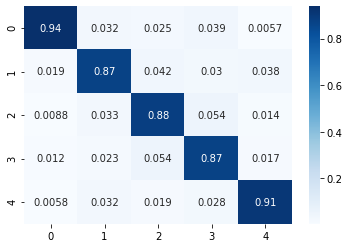

In [59]:
print("Extra Randomised tree Classification")
con_matrix_Randtree = confusion_matrix(Y_test, Y_pred_Randtree)
con_matrix_Randtree =con_matrix_Randtree / con_matrix_Randtree.astype(np.float).sum(axis=1)
sns.heatmap(con_matrix_Randtree, annot=True,cmap=plt.cm.Blues)

# AFTER CROSS VALIDATION

Text(0.5, 51.00000000000006, 'Predicted label')

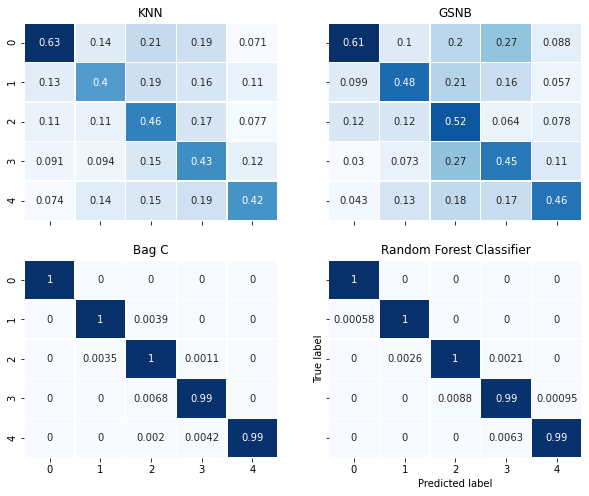

In [64]:
from sklearn.metrics import confusion_matrix

con_matrix_KNN = confusion_matrix(Y_test, Y_pred_eknn)
con_matrix_KNN =con_matrix_KNN / con_matrix_KNN.astype(np.float).sum(axis=1)

con_matrix_GaussNB = confusion_matrix(Y_test,Y_pred_GaussNB)
con_matrix_GaussNB =con_matrix_GaussNB / con_matrix_GaussNB.astype(np.float).sum(axis=1)

con_matrix_BaggingC = confusion_matrix(Y_test, Y_pred_BaggC)
con_matrix_BaggingC =con_matrix_BaggingC / con_matrix_BaggingC.astype(np.float).sum(axis=1)

con_matrix_RandFC = confusion_matrix(Y_test, Y_pred_RandomFC)
con_matrix_RandFC =con_matrix_RandFC / con_matrix_RandFC.astype(np.float).sum(axis=1)

f, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, sharex='col', sharey='row', figsize=(10,8))
sns.heatmap(con_matrix_KNN, annot = True,  linewidths=.5, ax=ax1, cbar =None, cmap=plt.cm.Blues)
ax1.set_title('KNN')
plt.ylabel('True label')
plt.xlabel('Predicted label')
sns.heatmap(con_matrix_GaussNB, annot = True,  linewidths=.5, ax=ax2, cbar =None, cmap=plt.cm.Blues,)
ax2.set_title('GSNB')
plt.ylabel('True label')
plt.xlabel('Predicted label')
sns.heatmap(con_matrix_BaggingC, annot = True, linewidths=.5, ax=ax3, cbar =None, cmap=plt.cm.Blues)
ax3.set_title('Bag C')
plt.ylabel('True label')
plt.xlabel('Predicted label')
sns.heatmap(con_matrix_RandFC, annot = True, linewidths=.5, ax=ax4, cbar =None, cmap=plt.cm.Blues)
ax4.set_title('Random Forest Classifier')
plt.ylabel('True label')
plt.xlabel('Predicted label')

Text(0.5, 15.0, 'Predicted label')

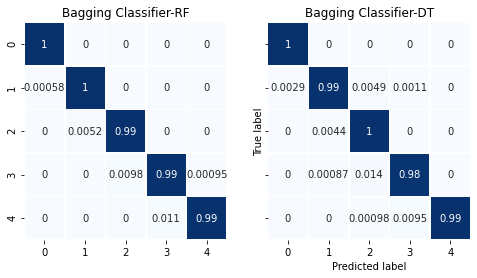

In [67]:
con_matrix_BaggingC_RandFC = confusion_matrix(Y_test, Y_pred_BaggC_RandF)
con_matrix_BaggingC_RandFC=con_matrix_BaggingC_RandFC / con_matrix_BaggingC_RandFC.astype(np.float).sum(axis=1)

con_matrix_BaggingC_DtreeC = confusion_matrix(Y_test, Y_pred_BaggC_DTree)
con_matrix_BaggingC_DtreeC=con_matrix_BaggingC_DtreeC / con_matrix_BaggingC_DtreeC.astype(np.float).sum(axis=1)

f, (ax1, ax2) = plt.subplots(1, 2, sharex='col', sharey='row', figsize=(8,4))
sns.heatmap(con_matrix_BaggingC_RandFC, annot = True,  linewidths=.5, ax=ax1, cbar =None,  cmap=plt.cm.Blues)
ax1.set_title('Bagging Classifier-RF')
plt.ylabel('True label')
plt.xlabel('Predicted label')
sns.heatmap(con_matrix_BaggingC_DtreeC, annot = True, linewidths=.5, ax=ax2, cbar =None, cmap=plt.cm.Blues)
ax2.set_title('Bagging Classifier-DT')
plt.ylabel('True label')
plt.xlabel('Predicted label')